<a href="https://colab.research.google.com/github/EvgenEgorov/transcriptomics_msu_HW/blob/main/HW15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Практикум 15. Анализ CITE-Seq

In [ ]:
# Установка необходимых пакетов
!pip install scanpy[leiden] muon scikit-misc harmonypy mofapy2

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

In [ ]:
# Загрузка необходимых датасетов

## CITE-Seq
!wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE194nnn/GSE194122/suppl/GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz
!gunzip GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz

In [2]:
# Подгрузка необходимых библиотек
import scanpy as sc
import muon as mu
import pandas as pd
import seaborn as sns
import numpy as np

sc.set_figure_params(dpi=150)

In [3]:
# Вспомогательная функция, чтобы создать объект
def create_MuData(adata, var_key="feature_types", layer="counts", batch_key="batch",
                  obs_columns=["cell_type", "batch"], batches=["s1d1", "s2d4"]):
  mdata = {}
  for mod in set(adata.var[var_key]):
    if layer == "X":
      X = adata[np.isin(adata.obs[batch_key], batches), adata.var[var_key] == mod].X
    else:
      X = adata[np.isin(adata.obs[batch_key], batches), adata.var[var_key] == mod].layers[layer]
    mdata[mod] = sc.AnnData(X=X, obs=adata[np.isin(adata.obs[batch_key], batches)].obs[obs_columns],
                            var=pd.DataFrame(index=f"{mod}_" + adata.var_names[adata.var[var_key] == mod]))
    mdata[mod].var_names_make_unique()
  mdata = mu.MuData(mdata)
  return mdata

# Чтение датасета CITE-Seq
adata_cite = sc.read_h5ad("GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad")
mdata = create_MuData(adata_cite)
del adata_cite

mdata["GEX"].layers["counts"] = mdata["GEX"].X.copy()
mdata["ADT"].layers["counts"] = mdata["ADT"].X.copy()

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Модальность РНК

### Без батч-коррекции

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


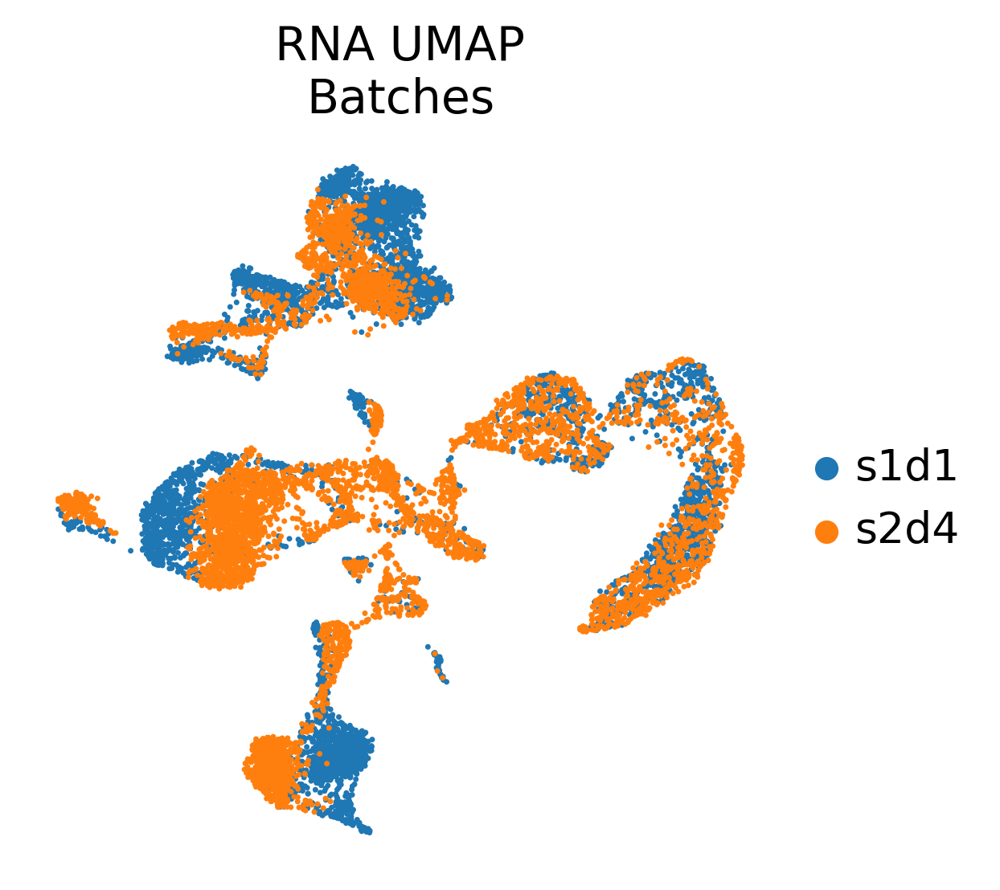

In [ ]:
# Убедимся, что в `adata.X` лежат каунты
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()

# Нормализация
sc.pp.normalize_total(mdata["GEX"])
sc.pp.log1p(mdata["GEX"])

# Выделение HVG
sc.pp.highly_variable_genes(mdata["GEX"], n_top_genes=3000,
                            flavor="seurat_v3", layer="counts")

# PCA
sc.pp.scale(mdata["GEX"], max_value=10)
sc.tl.pca(mdata["GEX"], n_comps=30)

# kNN-граф
sc.pp.neighbors(mdata["GEX"], n_neighbors=20)

# UMAP
sc.tl.umap(mdata["GEX"])
sc.pl.umap(mdata["GEX"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

### С батч-коррекцией

2022-12-25 12:05:01,244 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-25 12:05:07,129 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-25 12:05:07,232 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-25 12:05:10,774 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-25 12:05:14,334 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-25 12:05:17,899 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-25 12:05:21,519 - harmonypy - INFO - Converged after 4 iterations
INFO:harmonypy:Converged after 4 iterations


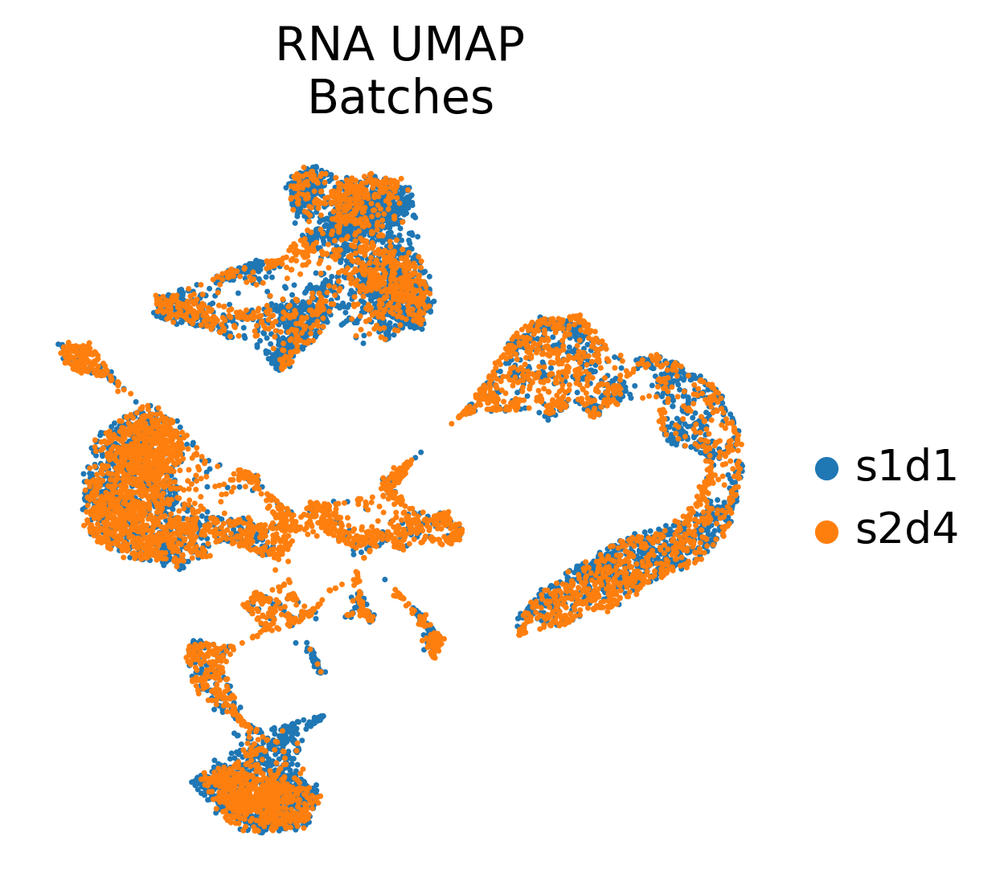

In [ ]:
# Коррекция батч-эффекта при помощи harmony
import scanpy.external as sce

# Убедимся, что в `adata.X` лежат каунты
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()

# Нормализация
sc.pp.normalize_total(mdata["GEX"], target_sum=1e4)
sc.pp.log1p(mdata["GEX"])

# Выделение HVG
sc.pp.highly_variable_genes(mdata["GEX"], n_top_genes=3000,
                            flavor="seurat_v3", layer="counts",
                            batch_key="batch")

# PCA и Harmony
mdata["GEX"].raw = mdata["GEX"]
sc.pp.scale(mdata["GEX"], max_value=10)
sc.tl.pca(mdata["GEX"], n_comps=30)
sce.pp.harmony_integrate(mdata["GEX"], key="batch", max_iter_harmony=20)

# kNN-граф
sc.pp.neighbors(mdata["GEX"], n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
sc.tl.umap(mdata["GEX"])
sc.pl.umap(mdata["GEX"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

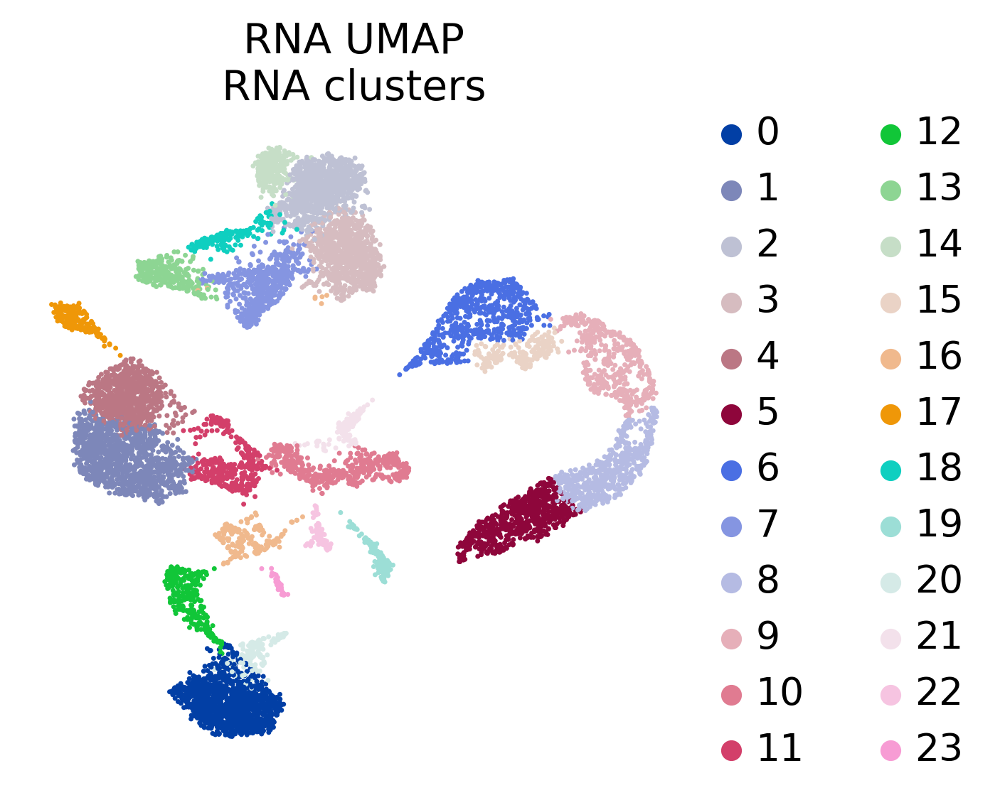

In [ ]:
# Кластеризация
sc.tl.leiden(mdata["GEX"], resolution=1)
sc.pl.umap(mdata["GEX"], color="leiden", frameon=False, 
           title="RNA UMAP\nRNA clusters")

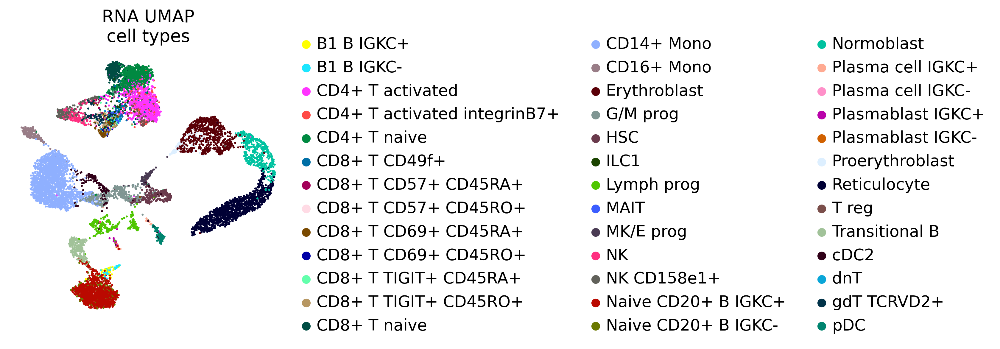

In [ ]:
sc.pl.umap(mdata["GEX"], color="cell_type", frameon=False, 
           title="RNA UMAP\ncell types")

## Модальность ADT

### Без батч-коррекции

/usr/local/lib/python3.8/dist-packages/muon/_prot/preproc.py:214: UserWarning: adata.X is sparse but not in CSC format. Converting to CSC.
  warn("adata.X is sparse but not in CSC format. Converting to CSC.")
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


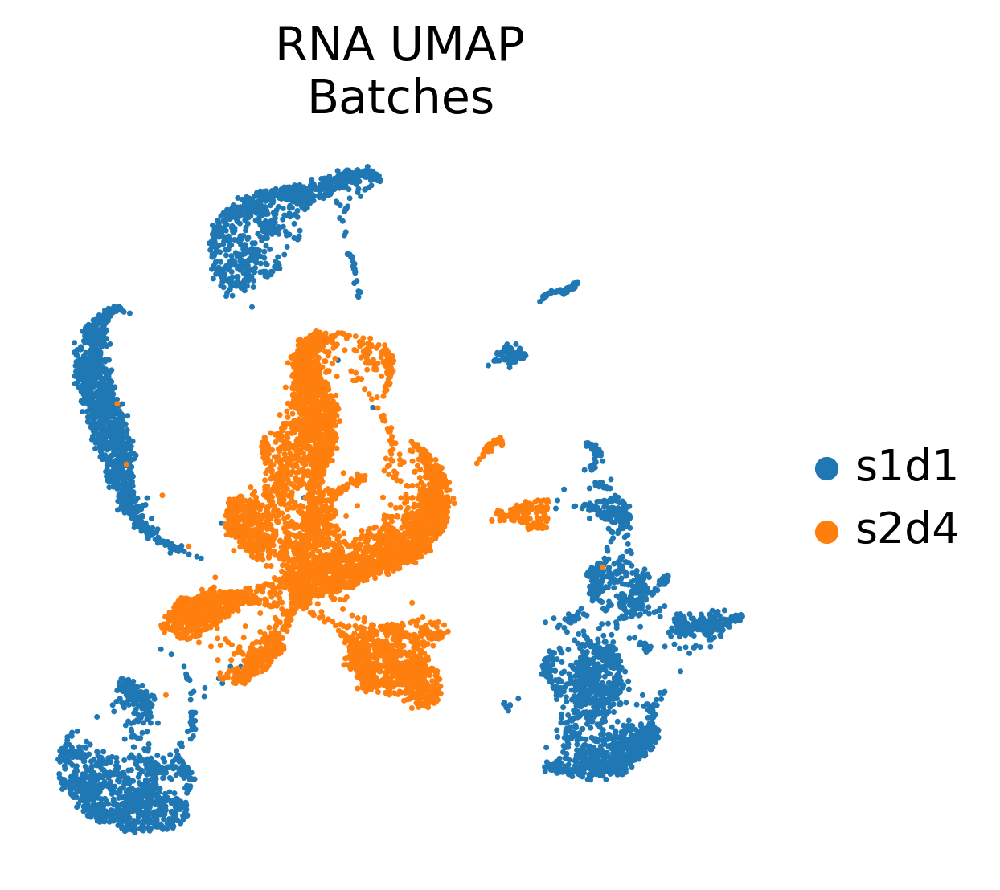

In [ ]:
# Убедимся, что в `adata.X` лежат каунты
mdata["ADT"].X = mdata["ADT"].layers["counts"].copy()

# CLR
mu.prot.pp.clr(mdata["ADT"])

# Все наши переменные считаем HVG
mdata["ADT"].var["highly_variable"] = True

# PCA
sc.pp.scale(mdata["ADT"], max_value=10)
sc.tl.pca(mdata["ADT"])

# kNN-граф
sc.pp.neighbors(mdata["ADT"], n_pcs=30, n_neighbors=20)

# UMAP
sc.tl.umap(mdata["ADT"])
sc.pl.umap(mdata["ADT"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

### С батч-коррекцией

2022-12-25 12:05:38,299 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-25 12:05:47,021 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-25 12:05:47,134 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-25 12:05:50,762 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-25 12:05:54,455 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-25 12:05:58,106 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-25 12:06:01,843 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-25 12:06:05,404 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-25 12:06:09,094 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-25 12:06:12,052 - 

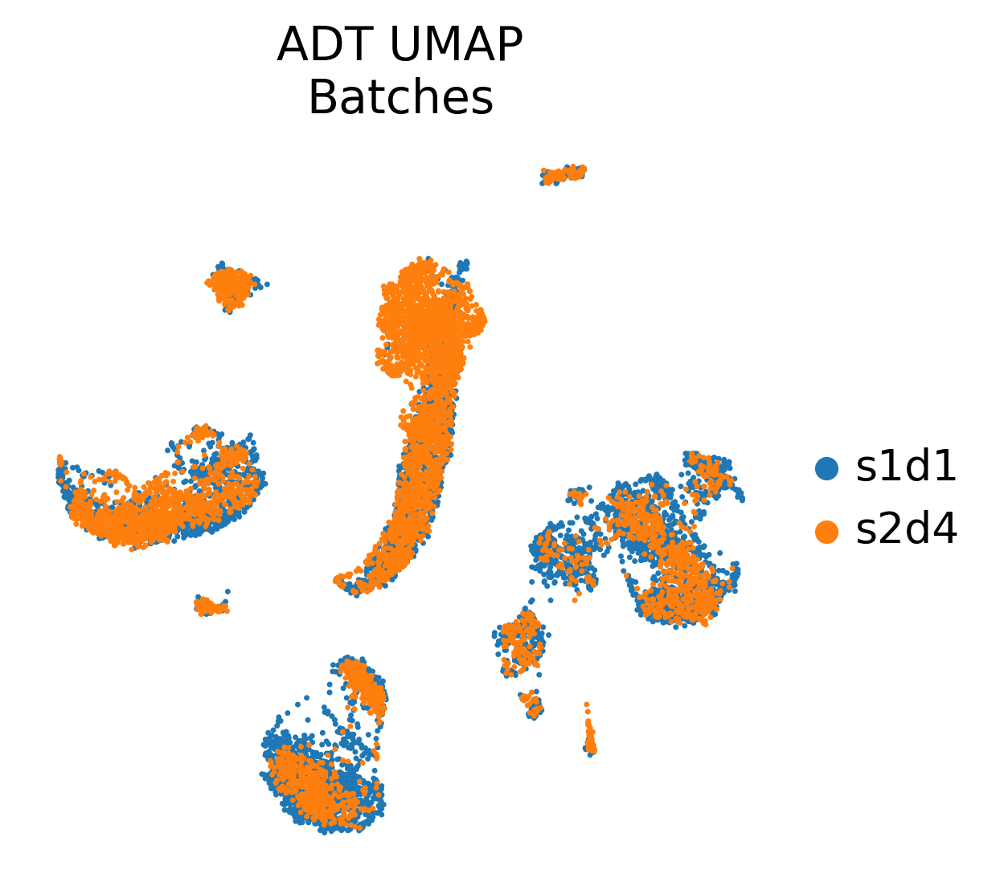

In [ ]:
# Убедимся, что в `adata.X` лежат каунты
mdata["ADT"].X = mdata["ADT"].layers["counts"].copy()

# CLR
mu.prot.pp.clr(mdata["ADT"])

# Все наши переменные считаем HVG
mdata["ADT"].var["highly_variable"] = True

# PCA
mdata["ADT"].raw = mdata["ADT"]
sc.pp.scale(mdata["ADT"], max_value=10)
sc.tl.pca(mdata["ADT"])
sce.pp.harmony_integrate(mdata["ADT"], key="batch", max_iter_harmony=20)

# kNN-граф
sc.pp.neighbors(mdata["ADT"], n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
sc.tl.umap(mdata["ADT"])
sc.pl.umap(mdata["ADT"], color="batch", frameon=False,
           title="ADT UMAP\nBatches")

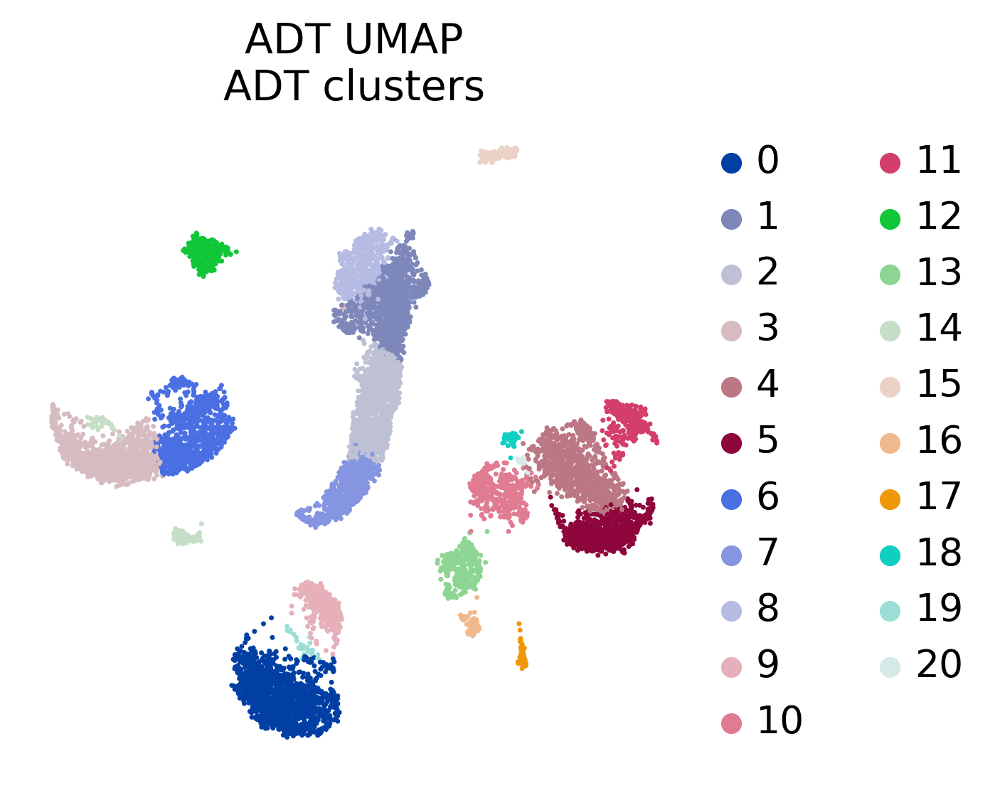

In [ ]:
sc.tl.leiden(mdata["ADT"], resolution=1)
sc.pl.umap(mdata["ADT"], color="leiden", frameon=False,
           title="ADT UMAP\nADT clusters")

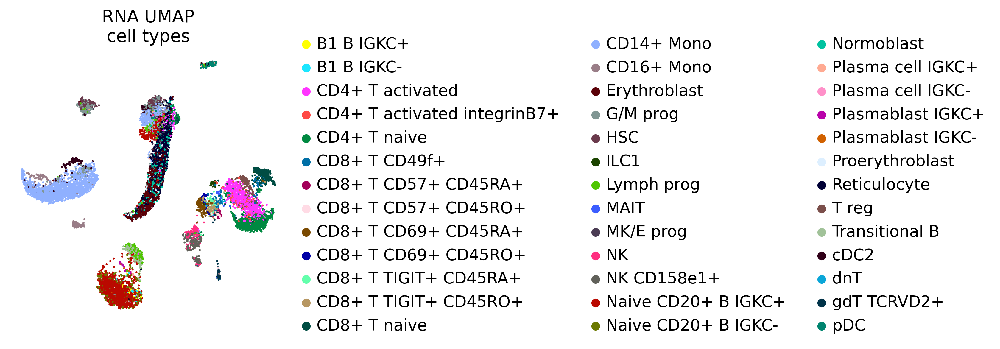

In [ ]:
sc.pl.umap(mdata["ADT"], color="cell_type", frameon=False, 
           title="RNA UMAP\ncell types")

## Поддержка различных модальностей

In [ ]:
sc.tl.leiden(mdata["GEX"], resolution=0.5)
sc.tl.leiden(mdata["ADT"], resolution=0.5)

mdata.obs["ADT:leiden"] = mdata["ADT"].obs["leiden"].copy()
mdata.obs["GEX:leiden"] = mdata["GEX"].obs["leiden"].copy()

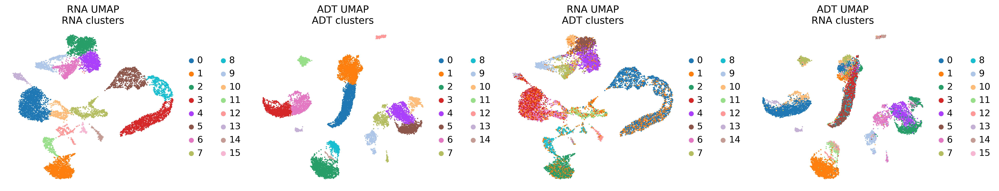

In [ ]:
fig, axes = plt.subplots(figsize=(20, 4), ncols=4)

mu.pl.embedding(mdata, basis="GEX:X_umap", color="GEX:leiden",
                frameon=False, title="RNA UMAP\nRNA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nADT clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="RNA UMAP\nADT clusters", ax=axes[2],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="GEX:leiden",
                frameon=False, title="ADT UMAP\nRNA clusters", ax=axes[3],
                show=False)

fig.tight_layout()

### MOFA

In [ ]:
# Запуск MOFA
mu.tl.mofa(mdata, n_factors=30, groups_label="GEX:batch")

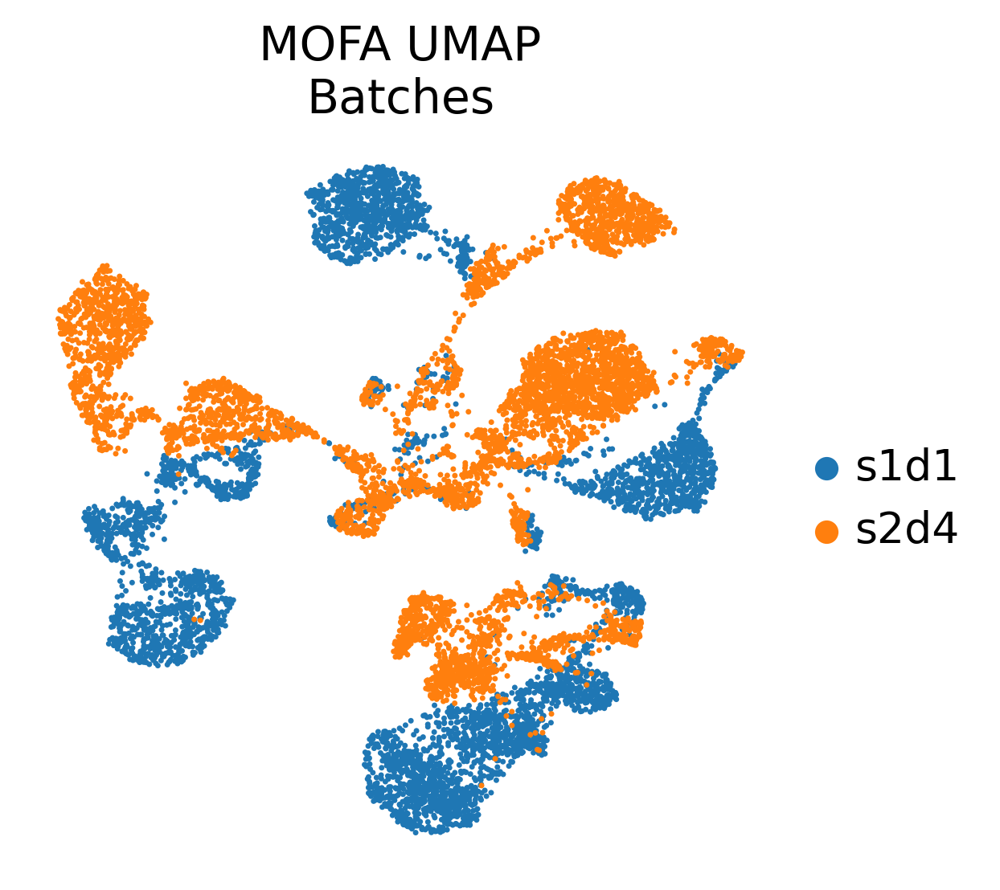

In [ ]:
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

2022-12-25 11:10:45,792 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-25 11:10:51,668 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-25 11:10:51,777 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-25 11:10:55,144 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-25 11:10:58,430 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-25 11:11:01,777 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-25 11:11:05,190 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-25 11:11:08,580 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-25 11:11:10,807 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-25 11:11:11,973 - 

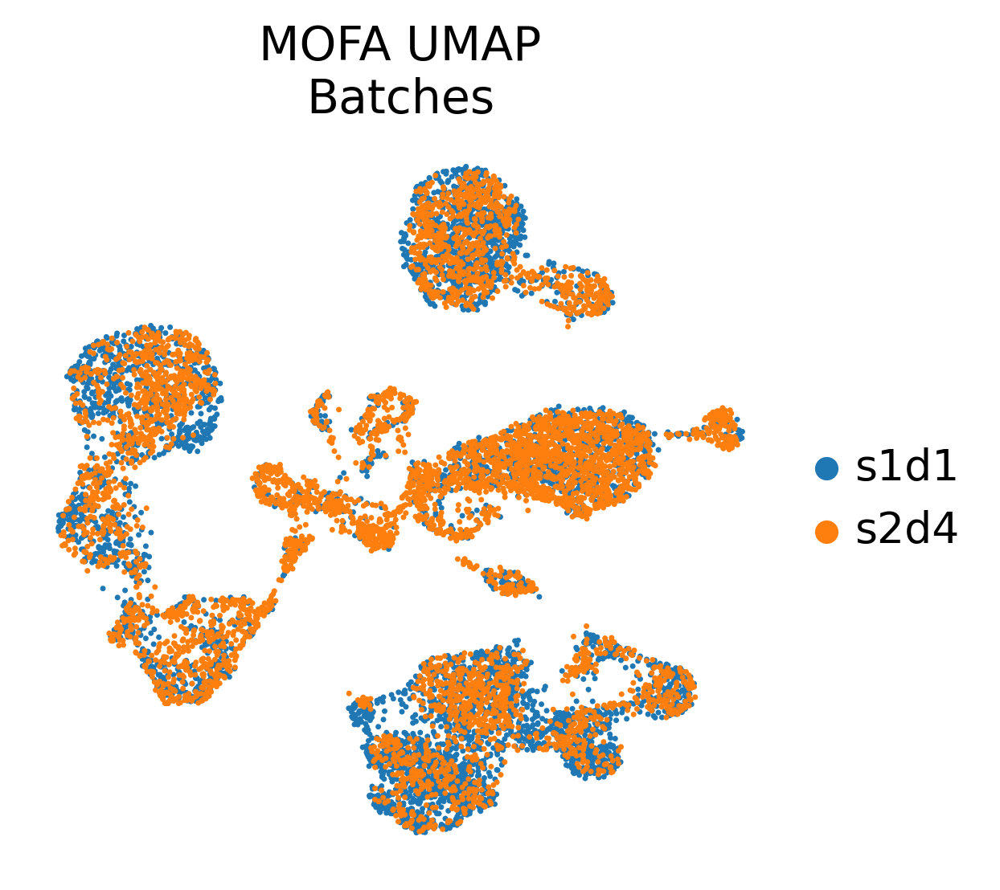

In [ ]:
# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


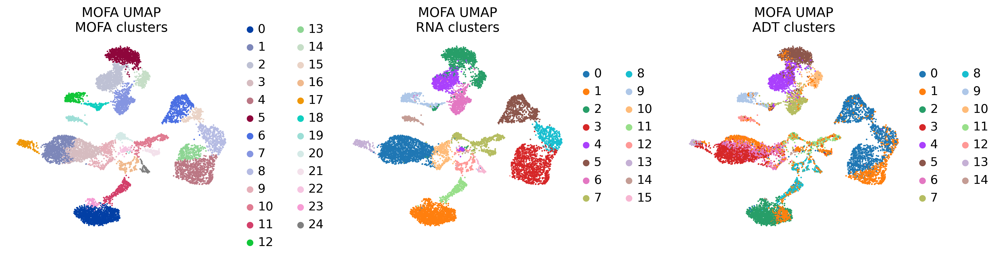

In [ ]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

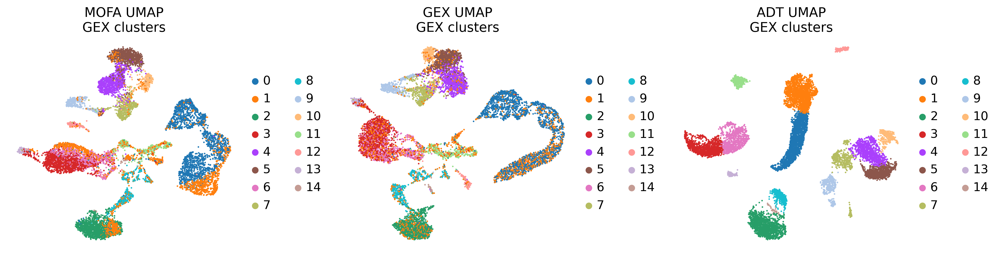

In [ ]:
# кластеризация
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nGEX clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="GEX UMAP\nGEX clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nGEX clusters", ax=axes[2],
                show=False)
fig.tight_layout()

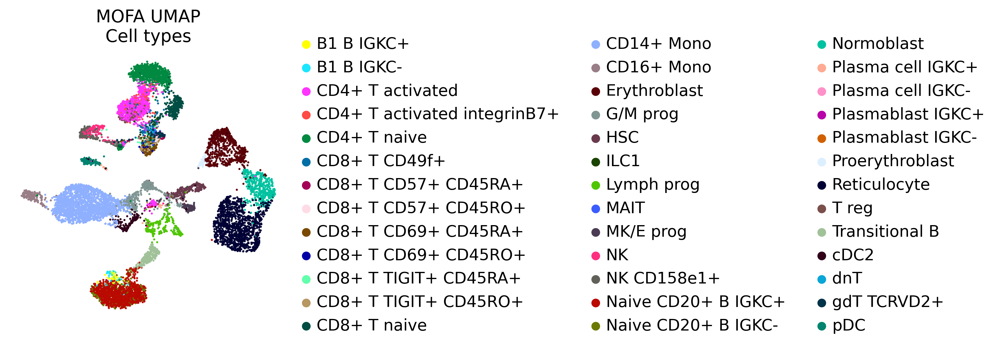

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:cell_type",
                frameon=False, title="MOFA UMAP\nCell types",)

### Задание

Попробуйте запустить MOFA с меньшим числом факторов (например, 10, как указано по умолчанию). Что поменялось?

In [ ]:
mu.tl.mofa(mdata, n_factors=10, groups_label="GEX:batch")

2022-12-25 12:52:09,053 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-25 12:52:13,844 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-25 12:52:13,967 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-25 12:52:17,583 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-25 12:52:21,235 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-25 12:52:24,873 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-25 12:52:29,187 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-25 12:52:32,978 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-25 12:52:36,604 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-25 12:52:40,263 - 

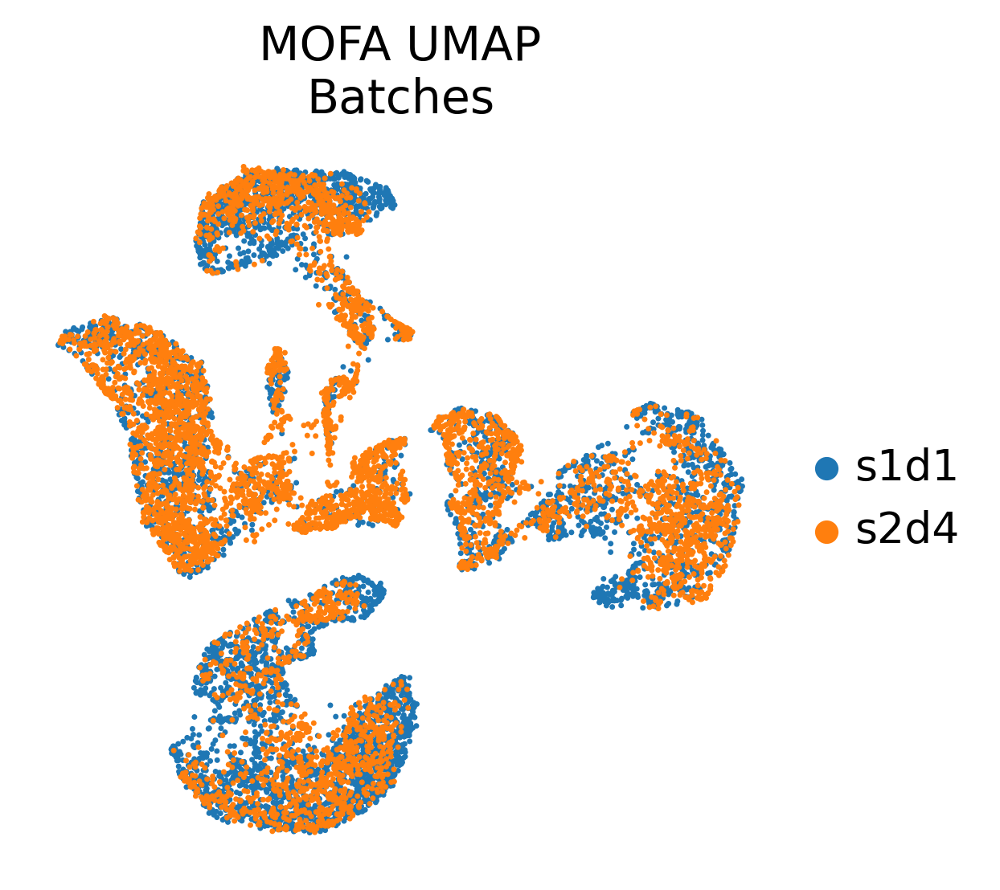

In [ ]:
# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=10, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

In [ ]:
del mdata.obs['leiden']

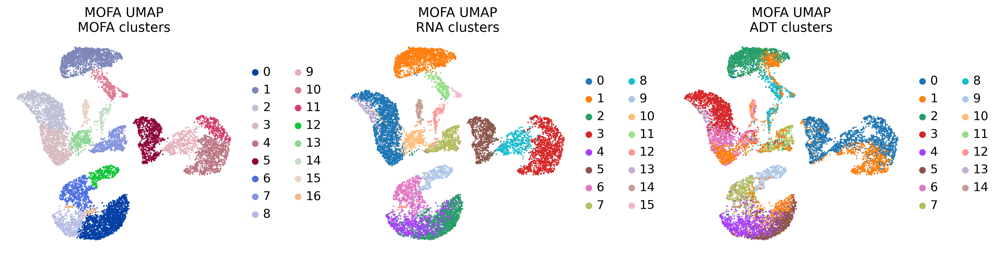

In [ ]:
# кластеризация
sc.tl.leiden(mdata, resolution = 0.5)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

В принципе, кластеры, вычисленные на MOFA-датасете (так сказать) совпадают с кластерами, вычисленными на модальностях GEX и ADT. 
Возможно, на это и было нацелено задание, однако я обнаружил, что, используя команду `sc.pp.neighbors`, то есть строя граф ближайших соседей, я не могу задать параметр `n_pcs` - число компонент, больше, чем число факторов, которое было использовано в команде `mofa`. То есть, если я сделаю 10 факторов, но 11 компонент, мне выдастся ошибка, возможно, так и должно быть.

### Задание

Попробуйте запустить MOFA на одной модальности (например, только на РНК). Сравните получившиеся результаты с PCA. Сходятся ли результаты?

In [ ]:
adata

AnnData object with n_obs × n_vars = 10811 × 13953
    obs: 'cell_type', 'batch', 'leiden'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'leiden', 'leiden_colors', 'cell_type_colors', 'mofa'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'X_mofa'
    varm: 'PCs', 'LFs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [ ]:
mu.tl.mofa(adata, n_factors=30, groups_label="batch")

2022-12-25 13:12:24,240 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-25 13:12:29,710 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-25 13:12:29,822 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-25 13:12:33,773 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-25 13:12:37,691 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-25 13:12:41,680 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-25 13:12:45,605 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-25 13:12:49,587 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


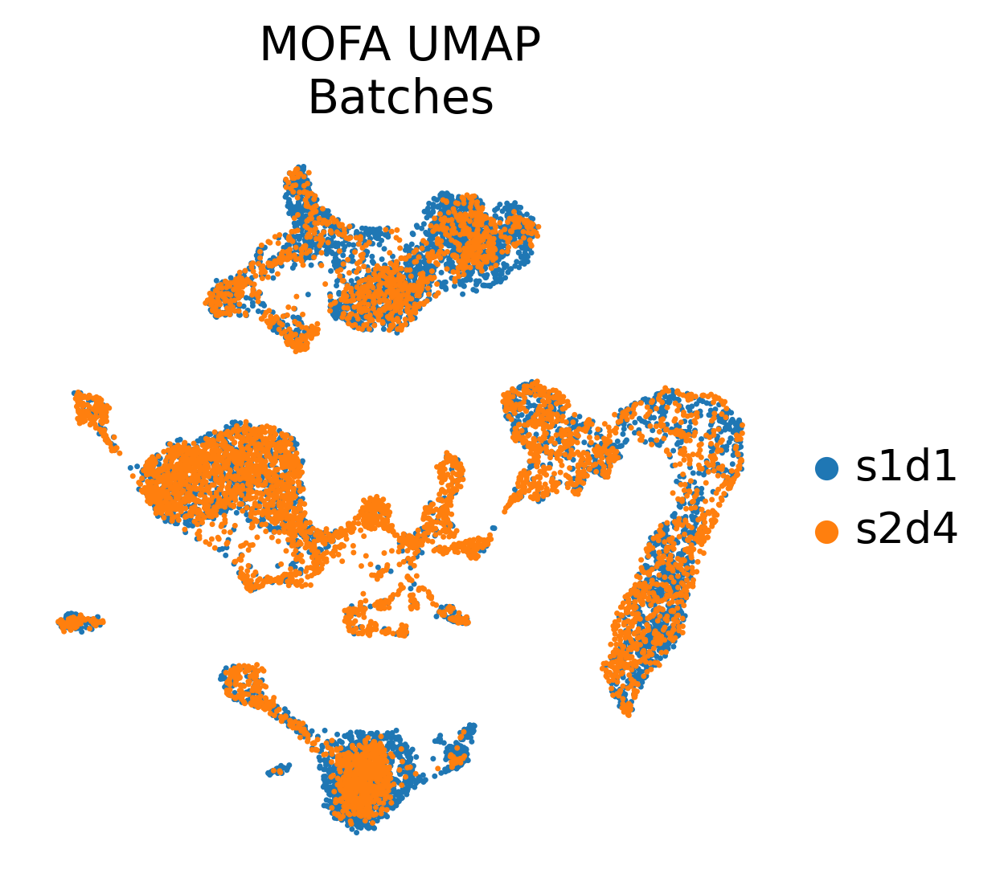

In [ ]:
# Harmony
sce.pp.harmony_integrate(adata, key="batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
adata.obsm["X_umap_MOFA"] = sc.tl.umap(adata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(adata, basis="X_umap_MOFA", color="batch", frameon=False,
                title="MOFA UMAP\nBatches")

<AxesSubplot: title={'center': 'MOFA UMAP\nRNA clusters'}, xlabel='X_umap_MOFA1', ylabel='X_umap_MOFA2'>

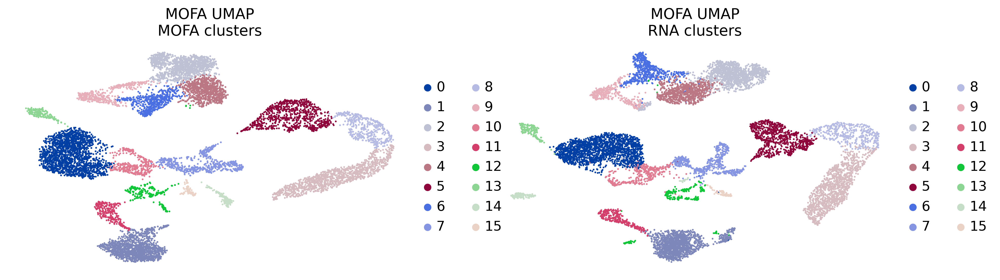

In [ ]:
fig, axes = plt.subplots(figsize=(15, 4), ncols=2)
mu.pl.embedding(adata, basis="X_umap", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(adata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)

UMAPы немного отличаются, однако в целом (примерно) структура данных одинаковая.

### WNN

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
Calculating kernel bandwidth for 'ADT' modality...
Calculating cell affinities for 'ADT modality...
Calculating kernel bandwidth for 'GEX' modality...
Calculating cell affinities for 'GEX modality...
Calculating nearest neighbor candidates for 'ADT' modality...
Calculating nearest neighbor candidates for 'GEX' modality...
Calculating multimodal nearest neighbors...
Calculating connectivities...
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


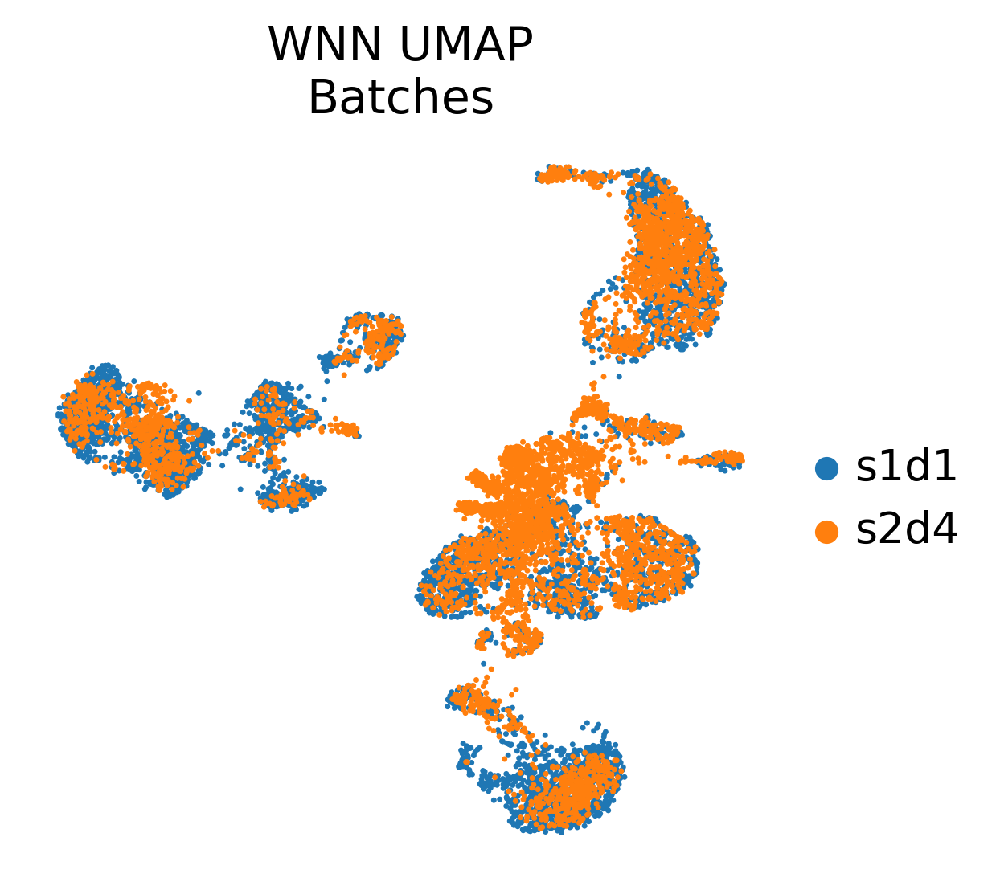

In [ ]:
# L2-нормализация PCA
mu.pp.l2norm(mdata, rep="X_pca_harmony")

# Построение графа соседей на L2-отнормированных PCs
sc.pp.neighbors(mdata["GEX"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")
sc.pp.neighbors(mdata["ADT"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")

# Построение WNN
mu.pp.neighbors(mdata)
mdata.obsm["X_umap_WNN"] = mu.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:batch", frameon=False,
                title="WNN UMAP\nBatches")

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


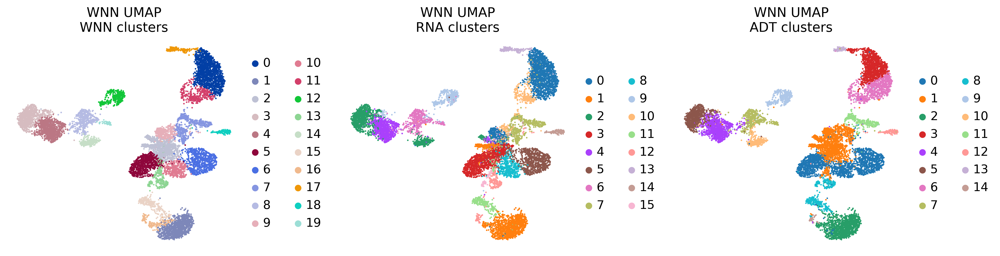

In [ ]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="leiden",
                frameon=False, title="WNN UMAP\nWNN clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:leiden",
                frameon=False, title="WNN UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="ADT:leiden",
                frameon=False, title="WNN UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

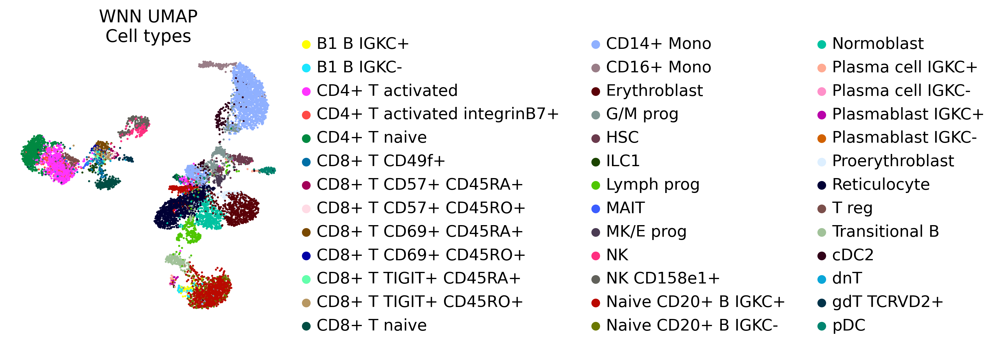

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:cell_type",
                frameon=False, title="WNN UMAP\nCell types",)

### Задание

Попробуйте запустить WNN без L2-нормализации PCA в начале. Что-то поменялось? Какой результат, на ваш взгляд, лучше?

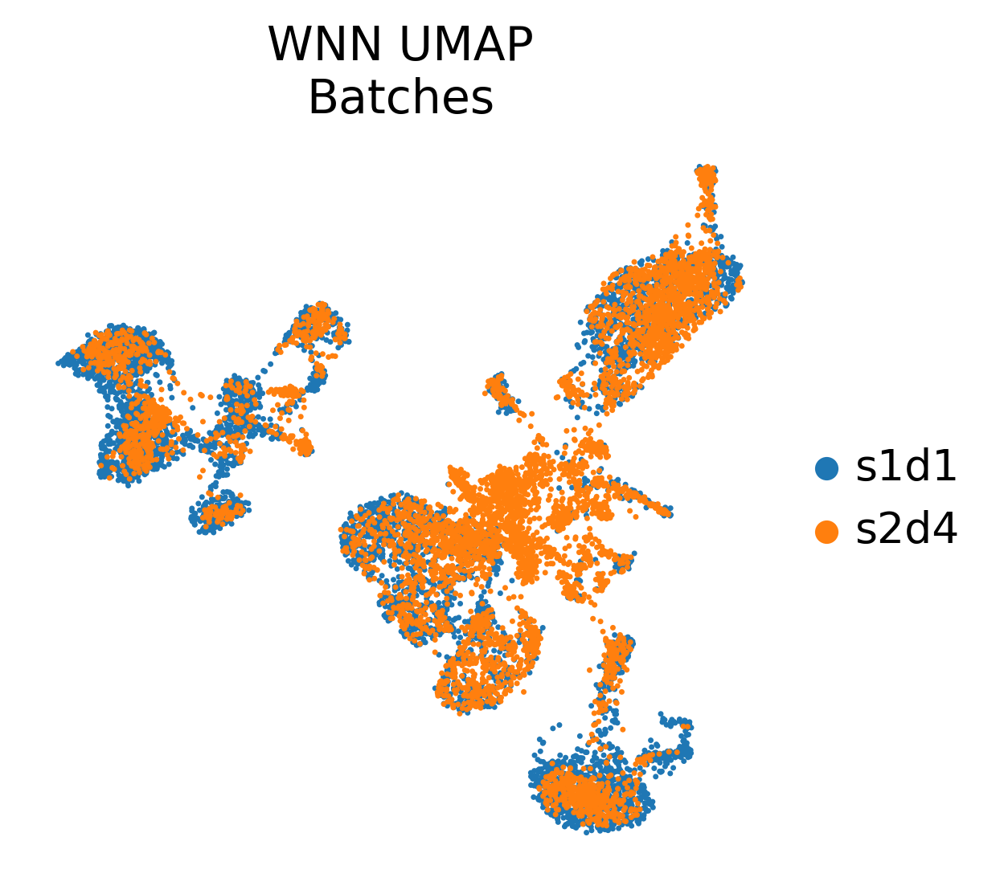

In [ ]:
sc.pp.neighbors(mdata["GEX"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")
sc.pp.neighbors(mdata["ADT"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")

# Построение WNN
mu.pp.neighbors(mdata)
mdata.obsm["X_umap_WNN"] = mu.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:batch", frameon=False,
                title="WNN UMAP\nBatches")



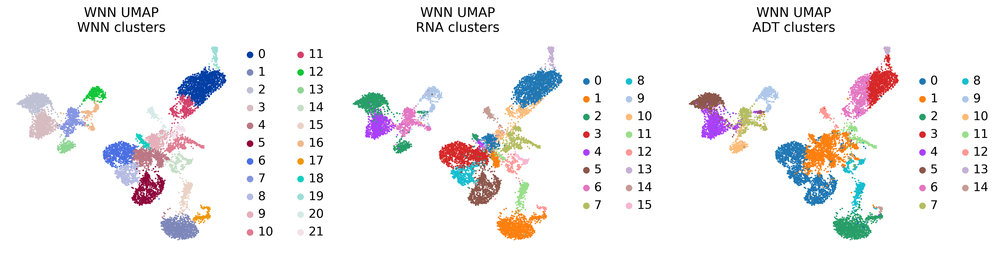

In [ ]:
del mdata.obs['leiden']
sc.tl.leiden(mdata)
mdata.update()
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="leiden",
                frameon=False, title="WNN UMAP\nWNN clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:leiden",
                frameon=False, title="WNN UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="ADT:leiden",
                frameon=False, title="WNN UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

Почему-то мне кажется, что ничего кардинально не поменялось - все кластера почти на том же месте, да и UMAP почти так же выглядит (хотя мы его тут заново не строили, так что ожидаемо). Кажется, нет разницы.

## PCA concatenation

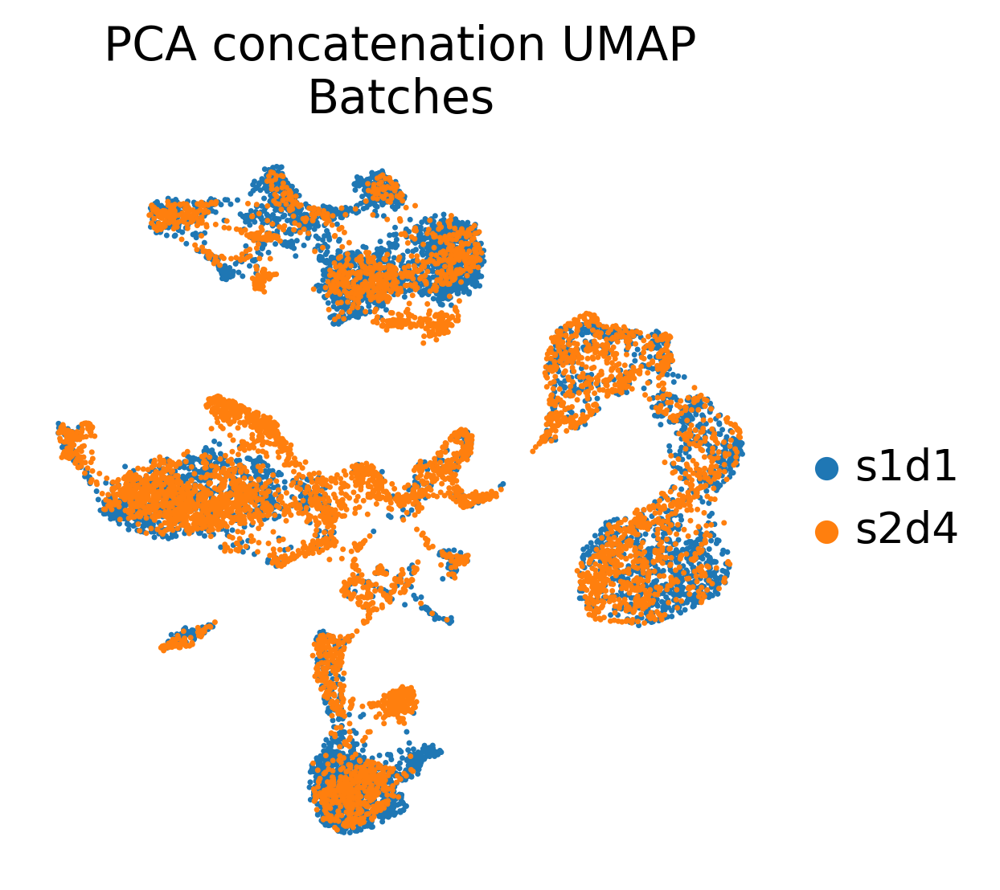

In [ ]:
sc.tl.pca(mdata["GEX"], n_comps=30)
sc.tl.pca(mdata["ADT"], n_comps=20)

sce.pp.harmony_integrate(mdata["GEX"], key="batch", max_iter_harmony=20, verbose=False)
sce.pp.harmony_integrate(mdata["ADT"], key="batch", max_iter_harmony=20, verbose=False)

mu.pp.l2norm(mdata, rep="X_pca_harmony")
mdata.obsm["X_pca_harmony"] = np.hstack([mdata["GEX"].obsm["X_pca_harmony"], mdata["ADT"].obsm["X_pca_harmony"]])

sc.pp.neighbors(mdata, n_neighbors=20, n_pcs=50, use_rep="X_pca_harmony")
mdata.obsm["X_umap_PCAconcat"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:batch", frameon=False,
                title="PCA concatenation UMAP\nBatches")

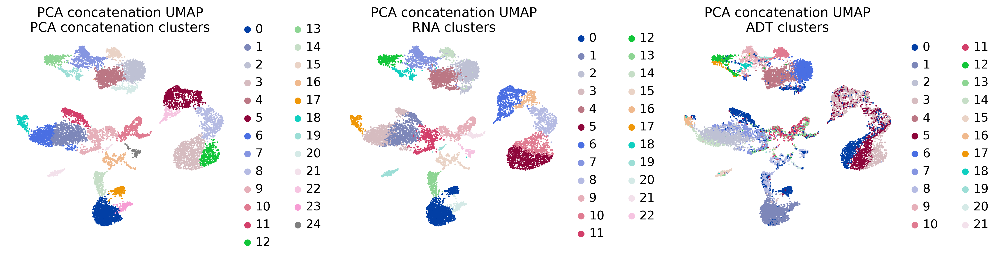

In [ ]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="leiden",
                frameon=False, title="PCA concatenation UMAP\nPCA concatenation clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:leiden",
                frameon=False, title="PCA concatenation UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="ADT:leiden",
                frameon=False, title="PCA concatenation UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

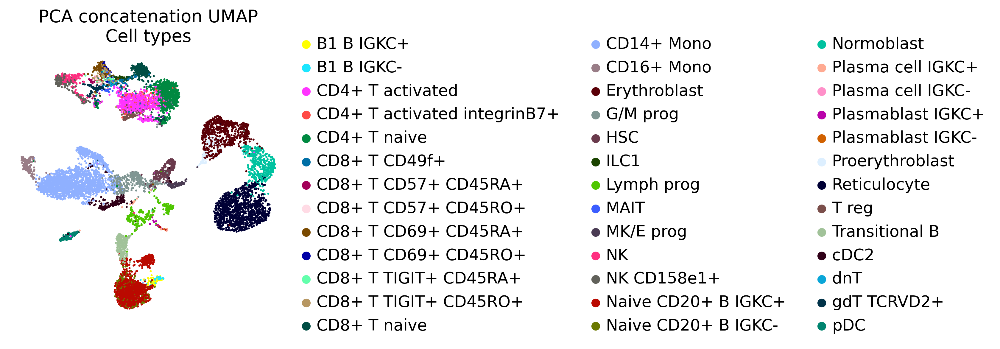

In [ ]:
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:cell_type",
                frameon=False, title="PCA concatenation UMAP\nCell types")

## Домашнее задание

Попробуйте написать функцию-wrapper через `rpy2`, которая бы реализовывала WNN, который имплементирован в Seurat. Есть ли разница с тем, что происходит в результате работы `muon`?

In [ ]:
# Установка нужных пакетов
!apt-get install libgmp3-dev libcairo2-dev libharfbuzz-dev libfribidi-dev libudunits2-dev
!gdown "1W0TuuQospxcasOX5cQdhT_Xd-k7-QAck&confirm=t"
!tar xf library.tar.gz

In [ ]:
import anndata2ri
anndata2ri.activate()

!pip install rpy2==3.5.1
%load_ext rpy2.ipython
%R .libPaths("usr/local/lib/R/site-library/")

In [67]:
import rpy2.robjects as ro

In [76]:
def seurat_wnn(mu_data):
  ro.r('library("Seurat")')
  ro.r('library("dplyr")')
  ro.globalenv["rna_data"] = mu_data["GEX"]
  ro.globalenv["adt_data"] = mu_data["ADT"]
  ro.r('counts_gex <- assay(gex_data,"X")')
  ro.r('counts_adt <- assay(adt_data,"X")')
  ro.r("gex_seurat <- CreateSeuratObject(counts = counts_gex)")
  ro.r("adt_assay <- CreateAssayObject(counts = counts_adt)")
  ro.r('gex_seurat[["ADT"]] <- adt_assay')
  ro.r("DefaultAssay(gex_seurat) <- 'RNA'")
  ro.r("gex_seurat <- NormalizeData(gex_seurat) %>% FindVariableFeatures() %>% ScaleData() %>% RunPCA()")
  ro.r('DefaultAssay(gex_seurat) <- "ADT"')
  ro.r('VariableFeatures(gex_seurat) <- rownames(gex_seurat[["ADT"]])')
  ro.r('gex_seurat <- NormalizeData(gex_seurat, normalization.method = "CLR", margin = 2) %>% ScaleData() %>% RunPCA(reduction.name = "apca")')
  ro.r('gex_seurat <- FindMultiModalNeighbors(gex_seurat, reduction.list = list("pca", "apca"), dims.list = list(1:30, 1:18), modality.weight.name = "RNA.weight", verbose = FALSE)')
  ro.r('gex_seurat <- RunUMAP(gex_seurat, nn.name = "weighted.nn", reduction.name = "wnn.umap", reduction.key = "wnnUMAP_", verbose = FALSE)')
  ro.r('gex_seurat <- FindClusters(gex_seurat, graph.name = "wsnn", algorithm = 3, resolution = 1, verbose = FALSE)')
  ro.r('p1 <- DimPlot(gex_seurat, reduction = "wnn.umap", label = TRUE, repel = TRUE, label.size = 4.5)')

In [ ]:
seurat_wnn(mdata)

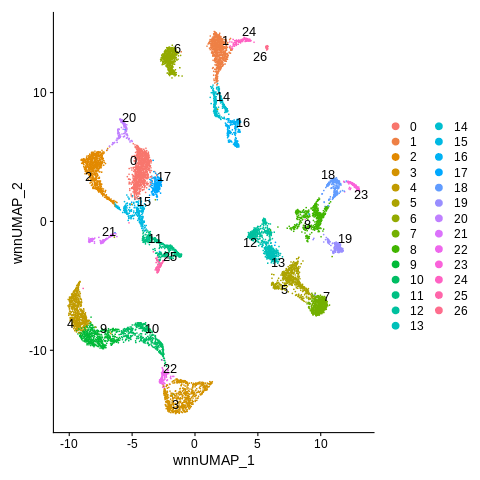

In [78]:
%%R
p1

Функция костыльная и очень специфическая (работает только для нашего датасета), но хотя бы так запустилось. UMAP получился совсем другой, но мы его с другими параметрами запускали, так что ожидаемо. В принципе, кажется, что WNN в MOFA и Seurat примерно одинаково работает.